In [2]:
import pandas as pd
from geopy import Point
from geopy.distance import distance

import matplotlib.pyplot as plt
import seaborn as sns

from functools import lru_cache
import time
from datetime import datetime


In [3]:
cities_df = pd.read_csv("cities.csv")
stations_df = pd.read_csv("stations.csv")
providers_df = pd.read_csv("providers.csv")
tickets_df = pd.read_csv("ticket_data.csv")

Tout d'abord on import les données, on verifie et ajuste les types des colonnes. J'ai aussi opté pour transformer les prix en Euros au lieu des centimes.

In [4]:
tickets_df['o_station'] = tickets_df['o_station'].astype(pd.Int64Dtype())
tickets_df['d_station'] = tickets_df['d_station'].astype(pd.Int64Dtype())

tickets_df['price'] = tickets_df['price_in_cents'].astype(float)/100
tickets_df = tickets_df.drop(columns=['price_in_cents'])

tickets_df.arrival_ts=pd.to_datetime(tickets_df.arrival_ts)
tickets_df.departure_ts=pd.to_datetime(tickets_df.departure_ts)
tickets_df.search_ts=pd.to_datetime(tickets_df.search_ts)

#on remplace les NA ici par des tableaux vides {}
tickets_df['middle_stations'] = tickets_df['middle_stations'].fillna('{}')
tickets_df['other_companies'] = tickets_df['other_companies'].fillna('{}')
tickets_df.set_index('id')

,company,o_station,d_station,departure_ts,arrival_ts,search_ts,middle_stations,other_companies,o_city,d_city,price
id,,,,,,,,,,,
6795025,8385,<NA>,<NA>,2017-10-13 14:00:00+00:00,2017-10-13 20:10:00+00:00,2017-10-01 00:13:31.327000+00:00,{},{},611,542,45.5
6795026,9,63,1044,2017-10-13 13:05:00+00:00,2017-10-14 06:55:00+00:00,2017-10-01 00:13:35.773000+00:00,"{149,418}",{13},611,542,14.5
6795027,8377,5905,6495,2017-10-13 13:27:00+00:00,2017-10-14 21:24:00+00:00,2017-10-01 00:13:40.212000+00:00,"{798,798,6794,6246}","{8377,8376}",611,542,74.0
6795028,8377,5905,6495,2017-10-13 13:27:00+00:00,2017-10-14 11:02:00+00:00,2017-10-01 00:13:40.213000+00:00,"{798,798,6794,6246}","{8377,8376}",611,542,135.0
6795029,8381,5905,6495,2017-10-13 21:46:00+00:00,2017-10-14 19:32:00+00:00,2017-10-01 00:13:40.213000+00:00,"{5983,5983}",{8380},611,542,77.1
...,...,...,...,...,...,...,...,...,...,...,...
6869182,13,279,10729,2017-10-27 02:30:00+00:00,2017-10-27 16:00:00+00:00,2017-10-19 10:35:42.943000+00:00,"{408,408}",{8371},628,562,25.9
6869185,9,279,304,2017-10-27 07:00:00+00:00,2017-10-27 13:30:00+00:00,2017-10-19 10:35:42.943000+00:00,"{1105,1105}",{9},628,562,27.0
6869187,8371,10642,304,2017-10-27 08:30:00+00:00,2017-10-27 15:15:00+00:00,2017-10-19 10:35:42.943000+00:00,"{1105,1105}",{9},628,562,30.0


après avoir adapté et nottoyé nos données il reste des NAs uniquement dans les stations de départs et arrivées, on comprendera plus tard que c'est lié aux covoiturages

In [5]:
tickets_df.isna().sum()

id                     0
company                0
o_station          41441
d_station          41441
departure_ts           0
arrival_ts             0
search_ts              0
middle_stations        0
other_companies        0
o_city                 0
d_city                 0
price                  0
dtype: int64

In [6]:
stations_df.set_index('id') #nous allons souvent effectuer des recherches et des jointures par id

,unique_name,latitude,longitude
id,,,
1,Aalen (Stuttgarter Straße),48.835296,10.092956
2,Aéroport Bordeaux-Mérignac,44.830226,-0.700883
3,Aéroport CDG,49.009900,2.559310
4,Aéroport de Berlin-Schönefeld,52.389446,13.520345
5,Aéroport de Dresden,51.123604,13.764737
...,...,...,...
11032,Porto Avda De Los Aliados,41.146922,-8.611122
11033,Rom Ciampino Flughafen Piazzale Leonardo da Vinci,41.804102,12.597110
11034,Sants,41.379892,2.139462


In [7]:
stations_df.isna().sum()

id             0
unique_name    0
latitude       0
longitude      0
dtype: int64

In [8]:
cities_df.set_index('id')

,local_name,unique_name,latitude,longitude,population
id,,,,,
5159,"Padua, Veneto, Italia",padua,45.406435,11.876761,209678.0
76,"Barcelona, Cataluña, España",barcelona,41.385064,2.173404,1611822.0
81,"Basel, Basel-Stadt, Schweiz",basel,47.593437,7.619812,NaN
259,"Erlangen, Bayern, Deutschland",erlangen,49.589674,11.011961,105412.0
11979,"Balș, Olt, România",balș,44.353354,24.095672,NaN
...,...,...,...,...,...
9964,"Saint-André-lez-Lille, Hauts-de-France, France",saint-andre-lez-lille,50.654250,3.047690,NaN
10863,"Kiev, Шевченківський район, Ukraine",kiev,50.450100,30.523400,NaN
11144,"Brighton, England, UK",brighton,50.822000,-0.137400,NaN


alors pour le fichier des cities il nous manque le unique name d'une ville et la population pour la majorité des villes, cette colonne sera donc peu utile pour la suite

In [9]:
cities_df.isna().sum()

id                0
local_name        0
unique_name       1
latitude          0
longitude         0
population     7671
dtype: int64

on trouve donc la ville avec le nom mal labélisé, il se trouve que c'est un endroit autour de Hambourg et on ne peut pas drop cette ligne car son id sera peut etre inclus dans des trajets

In [10]:
print(cities_df[cities_df.unique_name.isna()])
cities_df.isna().sum()

         id              local_name unique_name   latitude  longitude  \
6866  10244  , Hamburg, Deutschland         NaN  39.613402   2.880431   

      population  
6866         NaN  


id                0
local_name        0
unique_name       1
latitude          0
longitude         0
population     7671
dtype: int64

In [11]:
providers_df['has_wifi'] = providers_df['has_wifi'].astype('bool')
providers_df['has_plug'] = providers_df['has_plug'].astype('bool')
providers_df['has_adjustable_seats'] = providers_df['has_adjustable_seats'].astype('bool')
providers_df['has_bicycle'] = providers_df['has_bicycle'].astype('bool')
providers_df.set_index('id')


providers_df.dtypes

id                       int64
company_id               int64
provider_id             object
name                    object
fullname                object
has_wifi                  bool
has_plug                  bool
has_adjustable_seats      bool
has_bicycle               bool
transport_type          object
dtype: object

In [12]:
providers_df.isna().sum()
#seules données manquantes ce sont des providers Ids, on prendra ça en compte dans la suite

id                       0
company_id               0
provider_id             14
name                     0
fullname                 0
has_wifi                 0
has_plug                 0
has_adjustable_seats     0
has_bicycle              0
transport_type           0
dtype: int64

Nous allons maintenant calculer les distances des trajets: j'ai opté pour la bibliothéque geopy afin d'obtenir les distance entre deux points, d'ailleurs il faut d'abaord rajouter une colonne de coordonnées du type geopy.Point.

In [13]:
stations_df['coordinates'] = stations_df.apply(lambda row: Point(latitude=row['latitude'], longitude=row['longitude']), axis=1)
cities_df['coordinates'] = cities_df.apply(lambda row: Point(latitude=row['latitude'], longitude=row['longitude']), axis=1)


Pour le calcul de la distance, si on n'a pas de données de stations on calcule directement la distance entre la ville de départ et d'arrivée. 
Pour les autres, on calcule la distance en prenant en compte la liste des arrêts intermediaires.
J'utilise aussi un cache pour des raisons de performances: on evitera de calculer plusieurs fois la distance entre deux memes villes!

In [14]:
@lru_cache
def distance_in_km(start, end, city=False):
    if city:
        start_point = cities_df[cities_df['id'] == start].head(1).coordinates
        end_point = cities_df[cities_df['id'] == end].head(1).coordinates
    else:
        start_point = stations_df[stations_df['id'] == start].head(1).coordinates
        end_point = stations_df[stations_df['id'] == end].head(1).coordinates
    return distance(start_point, end_point).km

def distance_trip(ticket):
    if pd.isna(ticket.o_station):
        return distance_in_km(ticket.o_city, ticket.d_city, True)
    else:
        trip = [ticket.o_station] + list(map(int, ticket['middle_stations'][1:-1].split(','))) + [ticket.d_station]
        dist = sum([distance_in_km(trip[i+1], trip[i]) for i in range(len(trip)-1)])
        return dist



In [15]:
tickets_df['distance'] = tickets_df.apply(distance_trip, axis=1)
tickets_df['distance_splits'] = pd.cut(tickets_df.distance, [0,200,800, 2000, float("inf")]) #split en fonction des distances de trajet


<AxesSubplot:xlabel='distance', ylabel='distance'>

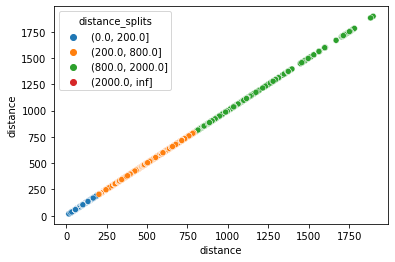

In [16]:
sns.scatterplot(data=tickets_df, x="distance", y="distance", hue="distance_splits") #on verifie qu'on a split correctement

On rajoute les noms des villes à notre tableau et on group_by la ville d'arrivée et la ville de départ afin d'avoir pour chaque trajet la distance moyenne, minimale et maximale.

In [17]:
trajets = tickets_df[['o_city','d_city','distance','price']].merge(cities_df[['unique_name','id']].rename(columns={'id':'id_'}), left_on='o_city', right_on='id_').drop(columns=['id_']).rename(columns={'unique_name':'o_city_name'})
trajets = trajets.merge(cities_df[['unique_name','id']].rename(columns={'id':'id_'}), left_on='d_city', right_on='id_').drop(columns=['id_']).rename(columns={'unique_name':'d_city_name'})

In [18]:
trajets.groupby(["o_city_name","d_city_name"]).agg({'price': ['count','min','mean','max'],
                                                                    'distance':['min','mean','max']})

price                            \
                                         count    min        mean    max   
o_city_name           d_city_name                                          
aeroport-paris-vatry- troyes                 1   53.0   53.000000   53.0   
agde                  amsterdam              5  186.0  203.200000  220.0   
agen                  dijon                  2   98.6  117.550000  136.5   
                      marseille             30   20.0   40.426667   89.2   
                      marseille-aeroport     6   37.0   38.333333   40.5   
...                                        ...    ...         ...    ...   
villefranche-sur-cher bordeaux              10   30.6   58.850000   76.7   
vitre                 nice                   2  150.7  184.950000  219.2   
zurich                dijon                  4   14.0   18.725000   24.0   
                      liege                  9   40.5   40.966667   41.9   
                      strasbourg             5   14.0   15.900000   17.8   

                                             distance               \
                                                  min         mean   
o_city_name           d_city_name                                    
aeroport-paris-vatry- troyes               272.080355   272.080355   
agde                  amsterdam           1052.910614  1052.910614   
agen                  dijon                578.981782   585.553283   
                      marseille            395.075517   410.979135   
                      marseille-aeroport   380.056318   380.056318   
...                                               ...          ...   
villefranche-sur-cher bordeaux             371.143652   375.230894   
vitre                 nice                 881.721669   894.039001   
zurich                dijon                271.533412   283.214119   
                      liege                422.353621   422.507980   
                      strasbourg           150.735532   150.735532   

                                                       
                                                  max  
o_city_name           d_city_name                      
aeroport-paris-vatry- troyes               272.080355  
agde                  amsterdam           1052.910614  
agen                  dijon                592.124785  
                      marseille            487.994462  
                      marseille-aeroport   380.056318  
...                                               ...  
villefranche-sur-cher bordeaux             380.407521  
vitre                 nice                 906.356334  
zurich                dijon                310.941475  
                      liege                422.585159  
                      strasbourg           150.735532  

[1437 rows x 7 columns]

on calcule d'autres informations : vitesse moyenne, prix au km et la durée du trajet.

In [19]:

tickets_df = tickets_df.join(providers_df[["transport_type","id"]].set_index('id'), on='company')

tickets_df['duration_in_min'] = (tickets_df.arrival_ts-tickets_df.departure_ts).dt.total_seconds()/60

tickets_df['speed_in_kmh'] = tickets_df['distance']/(tickets_df['duration_in_min']/60)
tickets_df['price_per_km'] = tickets_df['price']/tickets_df['distance']
tickets_df[['speed_in_kmh','price_per_km','distance','price','duration_in_min']].head()

,speed_in_kmh,price_per_km,distance,price,duration_in_min
0,81.589756,0.090433,503.136831,45.5,370.0
1,28.513839,0.028515,508.496804,14.5,1070.0
2,33.965028,0.068191,1085.182642,74.0,1917.0
3,50.278732,0.124403,1085.182642,135.0,1295.0
4,28.952643,0.122342,630.202522,77.1,1306.0


Pour chaque type de transport et intervalle de distance nous avons quues moyennes utiles et le nombre de trajets. pas de surprise le bus est le plus lent mais le moins cher surtout au delà de 200km, le train c'est le plus rapide au delà de 200km mais toujours le plus cher.

In [20]:
tickets_df.groupby(["distance_splits","transport_type"]).agg({'id': ['count'],
                                                            'price': 'mean', 
                                                            'duration_in_min':'mean', 
                                                            'speed_in_kmh':'mean', 
                                                            'price_per_km':'mean'})

id       price duration_in_min  \
                                count        mean            mean   
distance_splits transport_type                                      
(0.0, 200.0]    bus               585   19.858564      440.588034   
                carpooling      10043   11.773524      117.122374   
                train            2063   29.542511      258.632089   
(200.0, 800.0]  bus             11932   33.948167      888.255196   
                carpooling      31255   32.180643      285.787874   
                train           16080   88.285012      447.518657   
(800.0, 2000.0] bus              1281   68.132701     1628.466823   
                carpooling        143   86.265455      786.013986   
                train             786  164.951272      763.595420   
(2000.0, inf]   bus                 0         NaN             NaN   
                carpooling          0         NaN             NaN   
                train               0         NaN             NaN   

                               speed_in_kmh price_per_km  
                                       mean         mean  
distance_splits transport_type                            
(0.0, 200.0]    bus               28.282567     0.174628  
                carpooling        69.653119     0.089468  
                train             48.907606     0.213193  
(200.0, 800.0]  bus               40.032101     0.071372  
                carpooling        76.856410     0.088840  
                train             84.989581     0.197226  
(800.0, 2000.0] bus               43.233675     0.067092  
                carpooling        77.349381     0.087581  
                train             95.541417     0.176450  
(2000.0, inf]   bus                     NaN          NaN  
                carpooling              NaN          NaN  
                train                   NaN          NaN

Pour le bonus j'ai décidé d'appliquer quelques algorithmes de machine learning : je ne pouvais pas m'empecher avec autant de données et des prix à prédire.

On commence par le préprocessing: je garde les données de tickets qui me semblent potentiellement utiles:
les distances, dates, coordonnées des villes, durée du trajet, la différence entre la date de recherche et la date du voyage, ...

Je décompose les dates en elements (jour, mois, heure, jour de la semaine): les voyages et le tourisme sont trés cycliques et ces données peuvent aider à prédire le prix correctement


In [21]:

training = tickets_df[['distance','price','o_city','d_city','duration_in_min','company']]

#temps entre la recherche et le voyage
training['ts_before_trip'] = (tickets_df.departure_ts - tickets_df.search_ts).dt.total_seconds()/60

#nombre d'escales
training['nb_middle_sta'] = tickets_df.middle_stations.apply(lambda l: len(set(l[1:-1].split(','))) if (len(l) > 2) else 0)

for ts in ['arrival_ts','departure_ts','search_ts']:
    training[ts[0]+'_h'] = tickets_df[ts].dt.hour
    training[ts[0]+'_min'] = tickets_df[ts].dt.minute
    training[ts[0]+'_weekday'] = tickets_df[ts].dt.weekday
    training[ts[0]+'_day'] = tickets_df[ts].dt.day
    training[ts[0]+'_month'] = tickets_df[ts].dt.month

training.join(cities_df[[]])

,distance,price,o_city,d_city,duration_in_min,company,ts_before_trip,nb_middle_sta,a_h,a_min,...,d_h,d_min,d_weekday,d_day,d_month,s_h,s_min,s_weekday,s_day,s_month
0,503.136831,45.5,611,542,370.0,8385,18106.477883,0,20,10,...,14,0,4,13,10,0,13,6,1,10
1,508.496804,14.5,611,542,1070.0,9,18051.403783,2,6,55,...,13,5,4,13,10,0,13,6,1,10
2,1085.182642,74.0,611,542,1917.0,8377,18073.329800,3,21,24,...,13,27,4,13,10,0,13,6,1,10
3,1085.182642,135.0,611,542,1295.0,8377,18073.329783,3,11,2,...,13,27,4,13,10,0,13,6,1,10
4,630.202522,77.1,611,542,1306.0,8381,18572.329783,1,19,32,...,21,46,4,13,10,0,13,6,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,346.917950,25.9,628,562,810.0,13,11034.284283,1,16,0,...,2,30,4,27,10,10,35,3,19,10
74164,340.637280,27.0,628,562,390.0,9,11304.284283,1,13,30,...,7,0,4,27,10,10,35,3,19,10
74165,344.149299,30.0,628,562,405.0,8371,11394.284283,1,15,15,...,8,30,4,27,10,10,35,3,19,10
74166,373.242370,28.8,628,562,465.0,13,11689.284283,1,21,10,...,13,25,4,27,10,10,35,3,19,10


In [22]:
#on rajoute le coordonnées géographiques
training = training.merge(cities_df[['latitude', 'longitude','id']].rename(columns={'id':'id_'}), left_on='o_city', right_on='id_').drop(columns=['id_']).rename(columns={'latitude':'o_latitude','longitude':'o_longitude'})
training = training.merge(cities_df[['latitude', 'longitude','id']].rename(columns={'id':'id_'}), left_on='d_city', right_on='id_').drop(columns=['id_']).rename(columns={'latitude':'d_latitude','longitude':'d_longitude'})


In [23]:
training = training.join(providers_df[["transport_type","id","has_wifi","has_plug","has_adjustable_seats","has_bicycle"]].set_index('id'), on='company')
training = training.join(pd.get_dummies(training.transport_type))
training = training.drop(columns={"transport_type","company","o_city", "d_city"})


On affiche alors une matrice de corrélation afin de nous aider à décider quelles données enlever ou conserver avant de commencer à entrainer nos modeles.

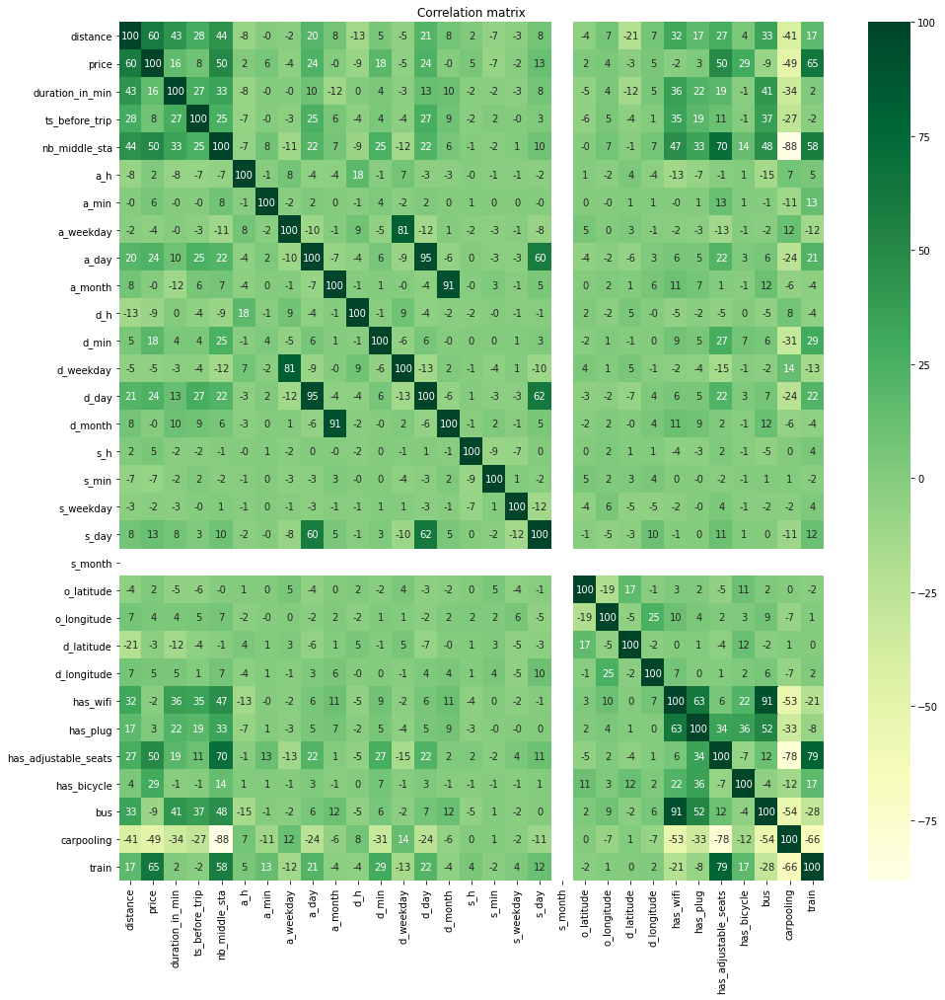

In [24]:
def corr_plot(trainin_df):
    plt.figure(figsize=(16, 16))
    corr = pd.get_dummies(trainin_df).corr()
    sns.heatmap(corr*100, cmap="YlGn", annot= True, fmt=".0f")
    plt.title('Correlation matrix')
    plt.show()
    
corr_plot(training)

On va verifier les valeurs des mois: en effet elles sont dominés par le mois d'octobre donc elle seront inutiles pour la suite, si elles étaient pour une année entière, elles auraient pu etre utiles. les coordonnés géographique semblent inutiles pour la suite.

On se débarasse des coordonnées et autres colonnes à faible corrélation

In [25]:
print(training.s_month.value_counts())
print(training.d_month.value_counts())
print(training.d_month.value_counts())

10    74168
Name: s_month, dtype: int64
10    69907
11     2969
12      881
9       254
1       100
2        30
3        27
Name: d_month, dtype: int64
10    69907
11     2969
12      881
9       254
1       100
2        30
3        27
Name: d_month, dtype: int64


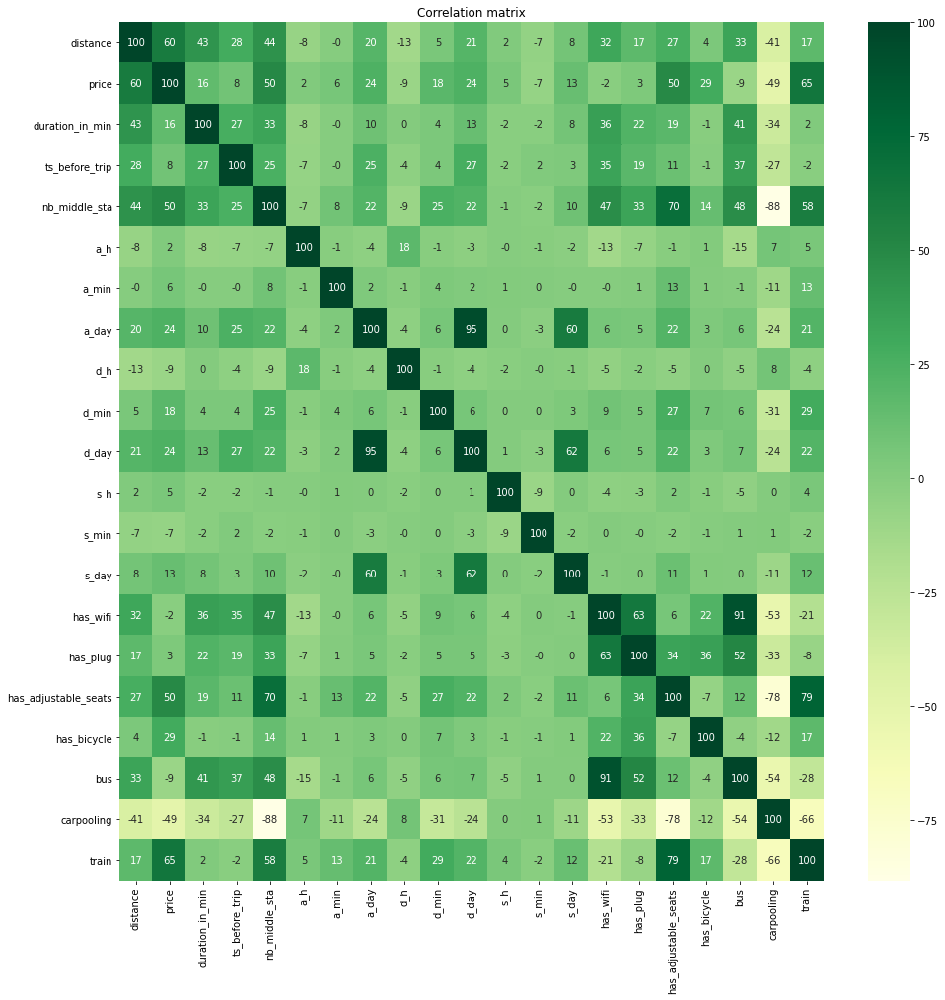

In [26]:
training = training.drop(columns={"a_month","d_month","s_month","d_longitude","o_longitude","d_latitude","o_latitude", "d_weekday", "s_weekday", "a_weekday"})
corr_plot(training)




On a donc fini notre préprocessing, place aux choses sérieuses

In [27]:
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import AdaBoostRegressor, RandomForestRegressor, BaggingRegressor, HistGradientBoostingRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor


In [48]:
results = pd.DataFrame(columns=['algo', 'r2_score', 'mae', 'mse']) #tableau pour enregistrer les scores des modèles

#shuffle avant de split en test et training, on veut deux datasets représentatifs et avec des observations equidistribuées
training = shuffle(training) 
# separer le price des données de prédiction
x = training.drop(["price"], axis=1).values
y = training["price"].values

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((55626, 20), (55626,), (18542, 20), (18542,))

In [49]:

model_adaboost = AdaBoostRegressor(n_estimators=30,
                          loss = 'linear',
                          base_estimator = DecisionTreeRegressor(max_depth=10))

model_adaboost.fit(X_train, y_train)




AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=10),
                  n_estimators=30)

In [50]:
prediction = model_adaboost.predict(X_test)
results = results.append([{'algo':'AdaBoost', 'r2_score':r2_score(y_test, prediction), 'mae':mean_absolute_error(y_test, prediction), 'mse':mean_squared_error(y_test, prediction)}])

In [51]:

model_bagging = BaggingRegressor(base_estimator=DecisionTreeRegressor(max_depth=20),
                    oob_score=True,
                    n_estimators=100,
                    n_jobs = -1)

model_bagging.fit(X_train, y_train)


BaggingRegressor(base_estimator=DecisionTreeRegressor(max_depth=20),
                 n_estimators=100, n_jobs=-1, oob_score=True)

In [52]:
prediction = model_bagging.predict(X_test)
results = results.append([{'algo':'Bagging','r2_score':r2_score(y_test, prediction), 'mae':mean_absolute_error(y_test, prediction), 'mse':mean_squared_error(y_test, prediction)}])

In [53]:
model_histGrad = HistGradientBoostingRegressor(max_iter = 500, n_iter_no_change=10)
model_histGrad.fit(X_train, y_train)


HistGradientBoostingRegressor(max_iter=400)

In [54]:
prediction = model_histGrad.predict(X_test)
results = results.append([{'algo':'HistGradientBoosting', 'r2_score':r2_score(y_test, prediction), 'mae':mean_absolute_error(y_test, prediction), 'mse':mean_squared_error(y_test, prediction)}])

In [55]:
model_randomForest = RandomForestRegressor(n_estimators=250, 
                        max_depth= 10,
                        oob_score= True,
                        n_jobs = -1)

model_randomForest.fit(X_train, y_train)


RandomForestRegressor(max_depth=10, n_estimators=250, n_jobs=-1, oob_score=True)

In [56]:
prediction = model_randomForest.predict(X_test)
results = results.append([{'algo':'RandomForest', 'r2_score':r2_score(y_test, prediction), 'mae':mean_absolute_error(y_test, prediction), 'mse':mean_squared_error(y_test, prediction)}])

In [65]:
model_gradBoosting = GradientBoostingRegressor(n_estimators=100,
                            n_iter_no_change=10)
model_gradBoosting.fit(X_train, y_train)

GradientBoostingRegressor(n_iter_no_change=10)

In [67]:
prediction = model_gradBoosting.predict(X_test)
results = results.append([{'algo':'GradientBoosting', 'r2_score':r2_score(y_test, prediction), 'mae':mean_absolute_error(y_test, prediction), 'mse':mean_squared_error(y_test, prediction)}])

In [68]:
results

,algo,r2_score,mae,mse
0,AdaBoost,0.915433,5.943115,120.892167
0,Bagging,0.943863,3.942376,80.250232
0,HistGradientBoosting,0.924092,5.368208,108.513651
0,RandomForest,0.890887,6.158383,155.982057
0,GradientBoosting,0.825748,7.898212,249.100089


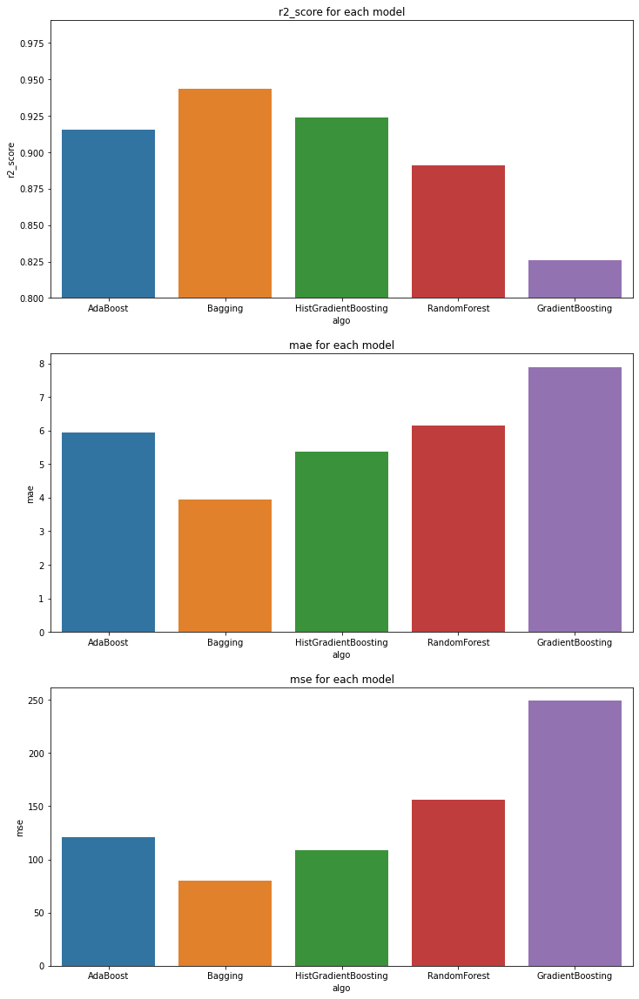

In [69]:
fig, axes = plt.subplots(3, 1, figsize=(12, 20))
sns.barplot(x="algo", y="r2_score", data=results, ax=axes[0]).set_title('r2_score for each model')
axes[0].set_ylim(0.80,)
sns.barplot(x="algo", y="mae", data=results, ax=axes[1]).set_title('mae for each model')
sns.barplot(x="algo", y="mse", data=results, ax=axes[2]).set_title('mse for each model')
plt.show()